In [18]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import random
import itertools
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import math
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img,img_to_array

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from keras.models import Model, Sequential, load_model
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Reshape, Dropout
from keras.preprocessing import image
# from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.metrics import BinaryIoU, MeanIoU


## models to import
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

# from skimage.color import convert_dtype



In [3]:
import warnings
warnings.filterwarnings('ignore')

# Data Loading

## Full sized images

In [ ]:
#- code for loading images and masks -#
#--------train data
train_img_dir=r"/kaggle/input/glaucoma-datasets/REFUGE/train/Images/"
train_mask_dir= r"/kaggle/input/glaucoma-datasets/REFUGE/train/Masks/"

# Get the list of file names for images and masks
image_files = sorted(os.listdir(train_img_dir))
mask_files = sorted(os.listdir(train_mask_dir))

# Create a DataFrame
train = pd.DataFrame({'file_name': image_files, 'mask_name': mask_files})

## --------test data
test_img_dir=r"/kaggle/input/glaucoma-datasets/REFUGE/test/Images/"
test_mask_dir= r"/kaggle/input/glaucoma-datasets/REFUGE/test/Masks/"

# Get the list of file names for images and masks
image_files = sorted(os.listdir(test_img_dir))
mask_files = sorted(os.listdir(test_mask_dir))

# Create a DataFrame
test = pd.DataFrame({'file_name': image_files, 'mask_name': mask_files})

## --------validation data
val_img_dir=r"/kaggle/input/glaucoma-datasets/REFUGE/val/Images/"
val_mask_dir= r"/kaggle/input/glaucoma-datasets/REFUGE/val/Masks/"

# Get the list of file names for images and masks
image_files = sorted(os.listdir(val_img_dir))
mask_files = sorted(os.listdir(val_mask_dir))

# Create a DataFrame
val = pd.DataFrame({'file_name': image_files, 'mask_name': mask_files})

target_size=(256,256)
################


def apply_clahe(image):
    """Applies CLAHE to an image for contrast enhancement using OpenCV."""
    if not isinstance(image, np.ndarray):
        image = np.array(image)
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create CLAHE object
    clahe = cv2.createCLAHE(clipLimit=2.5)

    # Apply CLAHE
    enhanced_image = clahe.apply(gray_image)

    # Convert back to RGB if needed
    enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_GRAY2BGR)
    return enhanced_image

def brightness_enhancment(image):
    brightness_image = cv2.convertScaleAbs(image, alpha=1.3, beta=20)
#     image_rgb=cv2.cvtColor(brightness_image, cv2.COLOR_BGR2RGB)
    image_bgr=brightness_image
    return image_bgr

def gamma_correction(image):
   # Gamma Correction
    gamma = 1.2
    lookup_table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    gamma_corrected_image = cv2.LUT(image, lookup_table)
#     image_rgb=cv2.cvtColor(gamma_corrected_image, cv2.COLOR_BGR2RGB)
    image_bgr=gamma_corrected_image
    return image_bgr

################

def read_image_and_mask(file_name, mask_name, img_dir, mask_dir, target_size=target_size):
    # Read image
    image = Image.open(img_dir + file_name)
    
    # Resize image
    image = image.resize(target_size)
#     image = apply_clahe(image)
#     image = brightness_enhancment(image)
#     image = gamma_correction(image)
    image_array = np.array(image)
    
    # Normalize image (optional)
#     image_array = image_array / 255.0
#     image_array = (image_array > 0).astype(np.uint8)
#     image_array = convert_dtype(image_array, dtype=np.uint8)

    # Read mask
    mask = Image.open(mask_dir + mask_name)
    # Resize mask
    mask = mask.resize(target_size)
    mask_array = np.array(mask)
#     mask_array = mask_array / 255.0
#    Ensure binary mask (optional)
#     mask_array = mask_array.astype(np.uint8)
    return image_array, mask_array

# Read training data
train_images = []
train_masks = []
for idx, row in train.iterrows():
    image, mask = read_image_and_mask(row['file_name'], row['mask_name'], train_img_dir, train_mask_dir)
    train_images.append(image)
    train_masks.append(mask)
    
train_images = np.array(train_images)
train_masks = np.array(train_masks)

# Read test data
test_images = []
test_masks = []
for idx, row in test.iterrows():
    image, mask = read_image_and_mask(row['file_name'], row['mask_name'], test_img_dir, test_mask_dir)
    test_images.append(image)
    test_masks.append(mask)
    
test_images = np.array(test_images)
test_masks = np.array(test_masks)


# Read validation data
valid_images = []
valid_masks = []
for idx, row in val.iterrows():
    image, mask = read_image_and_mask(row['file_name'], row['mask_name'], val_img_dir, val_mask_dir)
    valid_images.append(image)
    valid_masks.append(mask)
    
valid_images = np.array(valid_images)
valid_masks = np.array(valid_masks)

## Cropped Images

In [3]:
#- code for loading images and masks -#
#--------train data
train_img_dir=r"/kaggle/input/glaucoma-datasets/REFUGE/train/Images_Cropped/"
train_mask_dir= r"/kaggle/input/glaucoma-datasets/REFUGE/train/Masks_Cropped/"

# Get the list of file names for images and masks
image_files = sorted(os.listdir(train_img_dir))
mask_files = sorted(os.listdir(train_mask_dir))

# Create a DataFrame
train = pd.DataFrame({'file_name': image_files, 'mask_name': mask_files})

## --------test data
test_img_dir=r"/kaggle/input/glaucoma-datasets/REFUGE/test/Images_Cropped/"
test_mask_dir= r"/kaggle/input/glaucoma-datasets/REFUGE/test/Masks_Cropped/"

# Get the list of file names for images and masks
image_files = sorted(os.listdir(test_img_dir))
mask_files = sorted(os.listdir(test_mask_dir))

# Create a DataFrame
test = pd.DataFrame({'file_name': image_files, 'mask_name': mask_files})

## --------validation data
val_img_dir=r"/kaggle/input/glaucoma-datasets/REFUGE/val/Images_Cropped/"
val_mask_dir= r"/kaggle/input/glaucoma-datasets/REFUGE/val/Masks_Cropped/"

# Get the list of file names for images and masks
image_files = sorted(os.listdir(val_img_dir))
mask_files = sorted(os.listdir(val_mask_dir))

# Create a DataFrame
val = pd.DataFrame({'file_name': image_files, 'mask_name': mask_files})

target_size=(512,512)
################


def apply_clahe(image):
    """Applies CLAHE to an image for contrast enhancement using OpenCV."""
    if not isinstance(image, np.ndarray):
        image = np.array(image)
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create CLAHE object
    clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))

    # Apply CLAHE
    enhanced_image = clahe.apply(gray_image)

    # Convert back to RGB if needed
    enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_GRAY2BGR)
    return enhanced_image

def brightness_enhancment(image):
    brightness_image = cv2.convertScaleAbs(image, alpha=.8, beta=20)
#     image_rgb=cv2.cvtColor(brightness_image, cv2.COLOR_BGR2RGB)
    image_bgr=brightness_image
    return image_bgr

def gamma_correction(image):
   # Gamma Correction
    gamma = 2.5
    lookup_table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    gamma_corrected_image = cv2.LUT(image, lookup_table)
#     image_rgb=cv2.cvtColor(gamma_corrected_image, cv2.COLOR_BGR2RGB)
    image_bgr=gamma_corrected_image
    return image_bgr

################

def read_image_and_mask(file_name, mask_name, img_dir, mask_dir, target_size=target_size):
    # Read image
    image = Image.open(img_dir + file_name)
    
    # Resize image
    image = image.resize(target_size)
    image = apply_clahe(image)
    image = brightness_enhancment(image)
    image = gamma_correction(image)
    image_array = np.array(image)
    
    # Normalize image (optional)
#     image_array = image_array / 255.0
#     image_array = (image_array > 0).astype(np.uint8)
#     image_array = convert_dtype(image_array, dtype=np.uint8)

    # Read mask
    mask = Image.open(mask_dir + mask_name)
    # Resize mask
    mask = mask.resize(target_size)
    mask_array = np.array(mask)
#     mask_array = mask_array / 255.0
#    Ensure binary mask (optional)
#     mask_array = mask_array.astype(np.uint8)
    return image_array, mask_array

# Read training data
train_images = []
train_masks = []
for idx, row in train.iterrows():
    image, mask = read_image_and_mask(row['file_name'], row['mask_name'], train_img_dir, train_mask_dir)
    train_images.append(image)
    train_masks.append(mask)
    
train_images = np.array(train_images)
train_masks = np.array(train_masks)

# Read test data
test_images = []
test_masks = []
for idx, row in test.iterrows():
    image, mask = read_image_and_mask(row['file_name'], row['mask_name'], test_img_dir, test_mask_dir)
    test_images.append(image)
    test_masks.append(mask)
    
test_images = np.array(test_images)
test_masks = np.array(test_masks)


# Read validation data
valid_images = []
valid_masks = []
for idx, row in val.iterrows():
    image, mask = read_image_and_mask(row['file_name'], row['mask_name'], val_img_dir, val_mask_dir)
    valid_images.append(image)
    valid_masks.append(mask)
    
valid_images = np.array(valid_images)
valid_masks = np.array(valid_masks)

In [4]:
print("train images", train_images.shape,"---train masks",train_masks.shape, train_images.dtype, train_masks.dtype )

print("test images", test_images.shape,"---test masks", test_masks.shape, test_images.dtype, test_masks.dtype )

print("valid images", valid_images.shape,"---test masks", valid_masks.shape, valid_images.dtype, valid_masks.dtype )

train images (400, 512, 512, 3) ---train masks (400, 512, 512) uint8 uint8
test images (400, 512, 512, 3) ---test masks (400, 512, 512) uint8 uint8
valid images (400, 512, 512, 3) ---test masks (400, 512, 512) uint8 uint8


In [5]:
def show_image_with_mask(image, mask, title="Image and Mask"):
    """Displays an image and its corresponding mask side-by-side."""
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.imshow(image)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(122)
    plt.imshow(mask)  # Use grayscale for masks
    plt.title("Mask")
    plt.axis("off")

    plt.suptitle(title)
    plt.show()

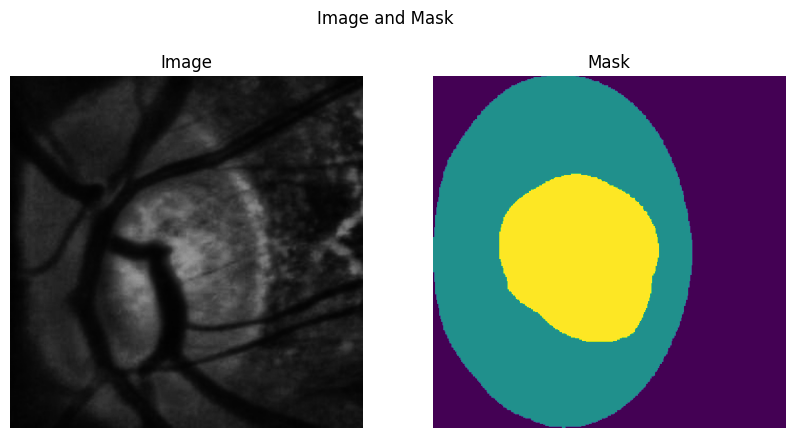

In [6]:
image = train_images[200]
mask = train_masks[200]

# Display the image and mask
show_image_with_mask(image, mask)

In [89]:
def apply_clahe(image):
    """Applies CLAHE to an image for contrast enhancement using OpenCV."""
    if not isinstance(image, np.ndarray):
        image = np.array(image)
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create CLAHE object
    clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8,8))

    # Apply CLAHE
    enhanced_image = clahe.apply(gray_image)

    # Convert back to RGB if needed
    enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_GRAY2BGR)
    return enhanced_image

def brightness_enhancment(image):
    brightness_image = cv2.convertScaleAbs(image, alpha=.8, beta=20)
#     image_rgb=cv2.cvtColor(brightness_image, cv2.COLOR_BGR2RGB)
    image_bgr=brightness_image
    return image_bgr

def gamma_correction(image):
   # Gamma Correction
    gamma = 2.5
    lookup_table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    gamma_corrected_image = cv2.LUT(image, lookup_table)
#     image_rgb=cv2.cvtColor(gamma_corrected_image, cv2.COLOR_BGR2RGB)
    image_bgr=gamma_corrected_image
    return image_bgr


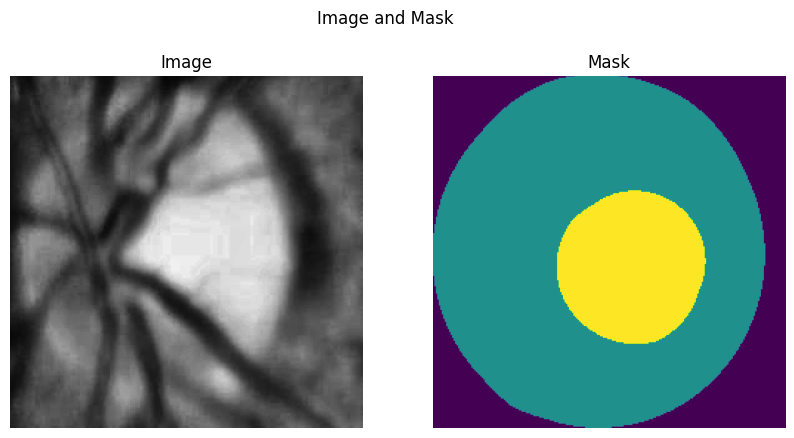

In [88]:
image = Image.open("/kaggle/input/glaucoma-datasets/REFUGE/test/Images_Cropped/T0006.jpg")
image = apply_clahe(image)
image = brightness_enhancment(image)
image = gamma_correction(image)

mask = Image.open("/kaggle/input/glaucoma-datasets/REFUGE/test/Masks_Cropped/T0008.png")

show_image_with_mask(image, mask)

In [ ]:
print(np.unique(train_masks))
print(np.unique(train_images))

# Data Augmentation

In [ ]:
import albumentations as A

# Define data augmentation pipeline for training data
train_transform = A.Compose([
    A.HorizontalFlip(p=1),  # Flips images horizontally with 50% probability
    A.RandomBrightnessContrast(p=1.0), # Randomly adjusts brightness and contrast
    A.RandomGamma(p=1.0),  # Randomly adjusts gamma correction
    A.CoarseDropout(p=1, max_holes=10, max_height=32, max_width=32)
#     A.ElasticTransform(alpha=120, sigma=120, alpha_affine=120, p=0.2),  # Elastic deformation
#     A.RandomCrop(width=target_size[0], height=target_size[1], always_apply=True),  # Ensures consistent size
#     A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),  # Normalizes pixel values
])

In [ ]:
augmented_images = []
augmented_masks = []
n_augmentations=4
for image, mask in zip(train_images, train_masks):
    augmented_images.append(image)
    augmented_masks.append(mask)
    # Apply augmentation to both image and mask (can repeat for multiple augmentations per image)
    for _ in range(n_augmentations):  # Adjust n_augmentations for desired number of variations
        augmented = train_transform(image=image.copy(), mask=mask.copy())  # Copy image and mask to avoid modifying originals
        #i have a dictionary with two keys and two different values
        augmented_image = augmented["image"]
        augmented_mask = augmented["mask"]
        augmented_images.append(augmented_image)
        augmented_masks.append(augmented_mask)

# Convert lists to numpy arrays
augmented_images = np.array(augmented_images)
augmented_masks = np.array(augmented_masks)

In [ ]:
print(len(augmented_images))
print(len(augmented_masks))
print(augmented_images.dtype)

# ---

In [ ]:
from tensorflow.keras.utils import to_categorical

# Function to one-hot encode masks
def one_hot_encode_masks(masks, num_classes):
    # Assuming masks are in the shape (batch_size, height, width)
    return np.array([to_categorical(mask, num_classes=num_classes) for mask in masks])


# One-hot encode the training and validation masks
augmented_masks = one_hot_encode_masks(augmented_masks, num_classes=3)
valid_masks = one_hot_encode_masks(valid_masks, num_classes=3)

print(len(augmented_images))
print(len(augmented_masks))
print(len(valid_images))
print(len(valid_masks))

# ----

# One Hot Encoding

In [7]:
from tensorflow.keras.utils import to_categorical

# Function to one-hot encode masks
def one_hot_encode_masks(masks, num_classes):
    # Assuming masks are in the shape (batch_size, height, width)
    return np.array([to_categorical(mask, num_classes=num_classes) for mask in masks])


# One-hot encode the training and validation masks
train_masks = one_hot_encode_masks(train_masks, num_classes=3)
valid_masks = one_hot_encode_masks(valid_masks, num_classes=3)
test_masks = one_hot_encode_masks(test_masks, num_classes=3)
print(len(train_images))
print(len(train_masks))
print(len(valid_images))
print(len(valid_masks))

# print(augmented_images.dtype)

400
400
400
400


In [8]:
print(train_images.shape)
print(train_masks.shape)
print(test_images.shape)
print(test_masks.shape)
print(valid_images.shape)
print(valid_masks.shape)

(400, 512, 512, 3)
(400, 512, 512, 3)
(400, 512, 512, 3)
(400, 512, 512, 3)
(400, 512, 512, 3)
(400, 512, 512, 3)


### Model weights

In [ ]:
from sklearn.utils import class_weight

# Convert one-hot encoded masks back to class labels for computing class weights
train_masks_reshaped_encoded = np.argmax(train_masks, axis=-1).flatten()

class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                    classes=np.unique(train_masks_reshaped_encoded),
                                                    y=train_masks_reshaped_encoded)
class_weights

In [ ]:
class_weight_dict = dict(enumerate(class_weights))
class_weight_dict

In [ ]:
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}
class_weights_dict

In [ ]:
# Compute sample weights for each sample in the training set
train_masks_class_labels = np.argmax(train_masks, axis=-1)
sample_weights = np.zeros(train_masks_class_labels.shape)

for class_index, weight in class_weights_dict.items():
    sample_weights[train_masks_class_labels == class_index] = weight

# Flatten sample weights to match the batch size
sample_weights = sample_weights.flatten()


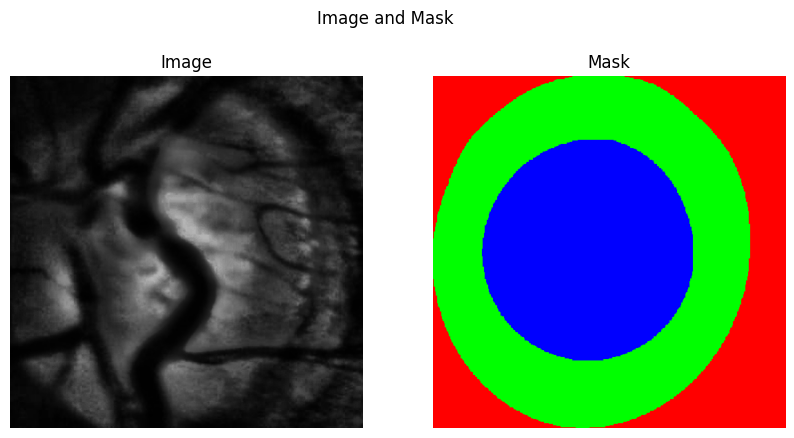

In [62]:
image = train_images[0]
mask = train_masks[0]

# Display the image and mask
show_image_with_mask(image, mask)

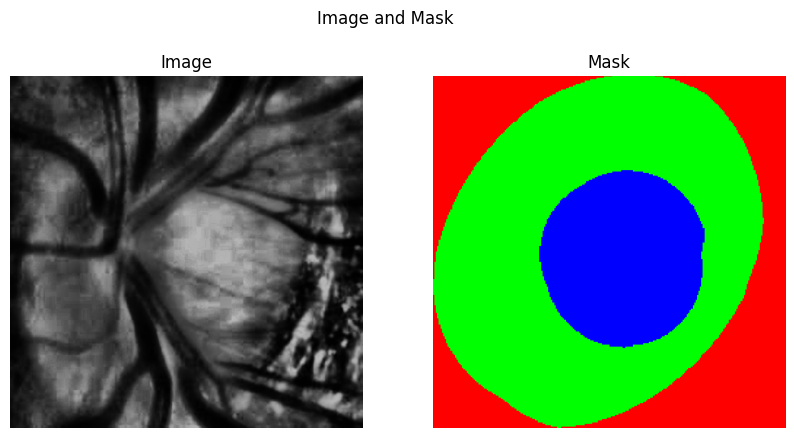

In [63]:
image = test_images[0]
mask = test_masks[0]

# Display the image and mask
show_image_with_mask(image, mask)

# CallBack

In [11]:
class DisplayCallback(keras.callbacks.Callback):
    def __init__(self, train_images, train_masks, epoch_interval=5):
        """
        Initialize the callback with separate train_images and train_masks arrays.

        Args:
            train_images (np.ndarray): Array containing training images.
            train_masks (np.ndarray): Array containing training masks.
            epoch_interval (int, optional): The number of epochs between visualizations (default: 5).
        """
        self.train_images = train_images
        self.train_masks = train_masks
        self.epoch_interval = epoch_interval

    def display(self, display_list, extra_title=''):
        """
        Displays a grid of images with titles.

        Args:
            display_list (list): A list of images to display.
            extra_title (str, optional): An additional title to display (default: '').
        """
        plt.figure(figsize=(15, 15))  # Adjust figure size as needed
        title = ['Input Image', 'True Mask', 'Predicted Mask']

        if len(display_list) > len(title):
            title.append(extra_title)

        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)
            plt.title(title[i])
            plt.imshow(display_list[i], cmap='gray')  # Adjust cmap if necessary
            plt.axis('off')
        plt.show()

    def create_mask(self, pred_mask):
        """
        Threshold and convert predicted mask to a binary array.

        Args:
            pred_mask (np.ndarray): The predicted mask from the model.

        Returns:
            np.ndarray: The thresholded and converted binary mask.
        """
        pred_mask = (pred_mask > 0.5).astype("int32")  # Threshold at 0.5 (adjust if needed)
        return pred_mask[0]  # Assuming the first element is the mask

    def show_predictions(self, num=1):
        """
        Shows predictions on a sample of images and masks from the training data.

        Args:
            num (int, optional): The number of samples to display (default: 1).
        """
        # Select random indices for samples
        sample_indices = np.random.choice(self.train_images.shape[0], size=num, replace=False)
        sample_images = self.train_images[sample_indices]
        sample_masks = self.train_masks[sample_indices]

        for image, mask in zip(sample_images, sample_masks):
            pred_mask = self.model.predict(np.expand_dims(image, axis=0))  # Add batch dimension
            self.display([image, mask, self.create_mask(pred_mask)])

    def on_epoch_end(self, epoch, logs=None):
        """
        Called at the end of each epoch. Prints a message and displays predictions if necessary.

        Args:
            epoch (int): The current epoch number.
            logs (dict, optional): Training logs (default: None).
        """
        if epoch and epoch % self.epoch_interval == 0:
            self.show_predictions()
            print('\nSample Prediction after epoch {}\n'.format(epoch+1))

checkpoint = ModelCheckpoint(
    "FIVES_model_ck2.keras",
    monitor='val_IoU',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode='max',
    save_freq='epoch'
)

early = EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=20,
    verbose=1,
    mode='min'
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    min_lr=0.00001,
    verbose=1
)


In [12]:
!pip install segmentation_models


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [16]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

# Model arch + training

In [19]:
# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()
BACKBONE   = 'efficientnetb0'
n_classes  = 3
activation = 'softmax' 

model = sm.Unet(BACKBONE, classes=n_classes, activation=activation ) #,encoder_freeze=True
model.summary()

AttributeError: module 'keras.src.activations' has no attribute 'get'

In [14]:
keras.backend.clear_session()
def conv_block(input, num_filters):
    conv = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(input)
    conv = tf.keras.layers.BatchNormalization()(conv)
    conv = tf.keras.layers.Activation("relu")(conv)
    conv = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(conv)
    conv = tf.keras.layers.BatchNormalization()(conv)
    conv = tf.keras.layers.Activation("relu")(conv)
    return conv

def encoder_block(input, num_filters):
    skip = conv_block(input, num_filters)
    pool = tf.keras.layers.MaxPool2D((2,2))(skip)
    return skip, pool

def decoder_block(input, skip, num_filters):
    up_conv = tf.keras.layers.Conv2DTranspose(num_filters, (2,2), strides=2, padding="same")(input)
    conv = tf.keras.layers.Concatenate()([up_conv, skip])
    conv = conv_block(conv, num_filters)
    return conv

def Unet(input_shape):
    inputs = tf.keras.layers.Input(input_shape)

    skip1, pool1 = encoder_block(inputs, 64)
    skip2, pool2 = encoder_block(pool1, 128)
    skip3, pool3 = encoder_block(pool2, 256)
    skip4, pool4 = encoder_block(pool3, 512)

    bridge = conv_block(pool4, 1024)

    decode1 = decoder_block(bridge, skip4, 512)
    decode2 = decoder_block(decode1, skip3, 256)
    decode3 = decoder_block(decode2, skip2, 128)
    decode4 = decoder_block(decode3, skip1, 64)
    outputs = tf.keras.layers.Conv2D(3, 1, padding="same", activation="softmax")(decode4)
    model = tf.keras.models.Model(inputs, outputs, name="U-Net")
    return model

# Input shape for 224x224 images
input_shape_224 = (512,512,3)

model = Unet(input_shape_224)
model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 512, 512,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │      1,024 │ conv2d_4[0][0]  

 Total params: 31,055,427 (118.47 MB)

 Trainable params: 31,043,651 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [15]:
# define optomizer
optim = keras.optimizers.Adam(0.001)
cc   = keras.losses.CategoricalCrossentropy()
metrics = [BinaryIoU(name='IoU')]
epochs=50

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, cc, metrics= metrics )

history = model.fit(train_images,
                    train_masks,
                    epochs=epochs,
                    validation_data=(valid_images, valid_masks),
#                     class_weight=class_weight_dict,
                    batch_size=8,
                    callbacks=[DisplayCallback(valid_images, valid_masks), lr_scheduler, checkpoint, early])


NameError: name 'model' is not defined

# Logs

In [69]:
# Save the entire model
model.save("/kaggle/working/REFUGEE_Cropped_efficientnetb0_45epoch_val_IoU: 0.4416.keras")

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model("/kaggle/input/from-pc/keras/1/1/REFUGEE_efficientnetb0_36epoch_0.95601.keras")

# Acc Vs Loss

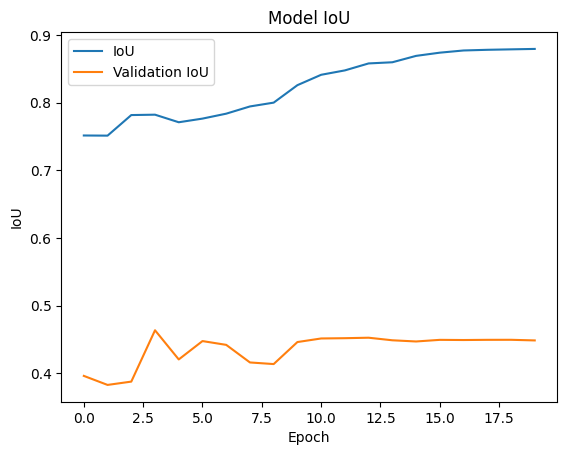

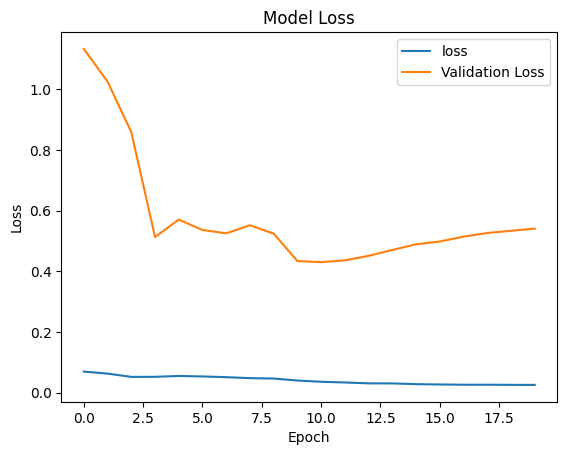

In [79]:
plt.plot(history.history["IoU"])
plt.plot(history.history['val_IoU'])
plt.title("Model IoU")
plt.ylabel("IoU")
plt.xlabel("Epoch")
plt.legend(["IoU","Validation IoU"])
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("Model Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(["loss","Validation Loss"])
plt.show()

# Model Evaluation

In [80]:
model.evaluate(x=test_images,y=test_masks)

13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 597ms/step - IoU: 0.5774 - loss: 0.6524


[0.6396345496177673, 0.4188893139362335]

# Testing model

In [73]:
pred = model.predict(test_images)

13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 501ms/step


In [22]:
pred.dtype
# np.unique(pred)

dtype('float32')

In [23]:
pred.shape

(400, 512, 512, 3)

In [ ]:
y_pred_argmax=np.argmax(pred, axis=3)

##################################################

#Using built in keras function
from keras.metrics import MeanIoU

IOU_keras = MeanIoU(num_classes=3)  
IOU_keras.update_state(test_masks[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

In [ ]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(3, 3)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[0,3] + values[1,0]+ values[2,0]+ values[3,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[1,3] + values[0,1]+ values[2,1]+ values[3,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[2,3] + values[0,2]+ values[1,2]+ values[3,2])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)


In [74]:
from sklearn.metrics import confusion_matrix, classification_report


threshold = 0.6  # You can adjust this threshold based on your needs


# Convert predicted probabilities to binary using the threshold
pred_binary = (pred > threshold).astype(np.uint8)

test_masks_flat = np.argmax(test_masks, axis=-1).flatten()
pred_binary_flat = np.argmax(pred_binary, axis=-1).flatten()

# Calculate the confusion matrix
cm = confusion_matrix(test_masks_flat, pred_binary_flat)

# Print the confusion matrix in a clear format
print("Confusion Matrix:")
print(cm)

# # Calculate true negatives (tn), false positives (fp), and other metrics (optional)
# tn = cm[0, 0]
# fp = cm[0, 1]
# fn = cm[1, 0]  # False negatives (for completeness)
# tp = cm[1, 1]  # True positives (for completeness)

# # Calculate additional metrics (e.g., precision, recall, F1-score)
# precision = tp / (tp + fp)
# recall = tp / (tp + fn)
# f1_score = 2 * (precision * recall) / (precision + recall)
# specificity=tn / (tn + fp)
# accuracy = (tp + tn) / (tp + tn + fp + fn)
# cr=classification_report(test_masks.flatten(), pred_binary.flatten())

# print("\nMetrics:")
# print("True Negatives (TN):", tn)
# print("False Positives (FP):", fp)
# print("False Negatives (FN):", fn)  # Added for completeness
# print("True Positives (TP):", tp)  # Added for completeness
# print("\nPrecision:", precision)
# print("Recall:", recall)
# print("F1-Score:", f1_score)
# print("specificity:", specificity)
# print("accuracy:", accuracy)
# print( cr)

Confusion Matrix:
[[31422746  3994131    85535]
 [ 1292818 44621087  5443968]
 [   55719  1096543 16845053]]


Class 0: Background (BG)
Class 1: Optic Disc (OD)
Class 2: Optic Cup (OC)

In [75]:
# Calculate TP, FP, FN, TN
TP = np.diag(cm)
FP = np.sum(cm, axis=0) - TP
FN = np.sum(cm, axis=1) - TP
TN = np.sum(cm) - (TP + FP + FN)

# Calculate Precision, Recall, F1-Score, Specificity, Accuracy
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = 2 * (precision * recall) / (precision + recall)
specificity = TN / (TN + FP)
accuracy = (TP + TN) / np.sum(cm)

# Print metrics
for i in range(3):
    print(f"Class {i} Metrics:")
    print(f"  Precision: {precision[i]:.4f}")
    print(f"  Recall: {recall[i]:.4f}")
    print(f"  F1-Score: {f1_score[i]:.4f}")
    print(f"  Specificity: {specificity[i]:.4f}")
    print(f"  Accuracy: {accuracy[i]:.4f}")
    print()

Class 0 Metrics:
  Precision: 0.9589
  Recall: 0.8851
  F1-Score: 0.9205
  Specificity: 0.9806
  Accuracy: 0.9482

Class 1 Metrics:
  Precision: 0.8976
  Recall: 0.8688
  F1-Score: 0.8830
  Specificity: 0.9048
  Accuracy: 0.8872

Class 2 Metrics:
  Precision: 0.7529
  Recall: 0.9360
  F1-Score: 0.8345
  Specificity: 0.9363
  Accuracy: 0.9363



In [76]:
import numpy as np


# Calculate IoU for each class
num_classes = cm.shape[0]  # Number of classes

iou_per_class = []

for i in range(num_classes):
    TP = cm[i, i]
    FP = np.sum(cm[:, i]) - TP
    FN = np.sum(cm[i, :]) - TP
    
    # Calculate IoU (Intersection over Union)
    intersection = TP
    union = TP + FP + FN  # TP + FP + FN is the union of the predicted and true masks
    
    if union == 0:
        iou = 0.0  # Handle division by zero
    else:
        iou = intersection / union
    
    iou_per_class.append(iou)

# Print IoU for each class
for i in range(num_classes):
    print(f"Class {i} IoU: {iou_per_class[i]:.4f}")

Class 0 IoU: 0.8527
Class 1 IoU: 0.7905
Class 2 IoU: 0.7160


# Image - Prediction - GT

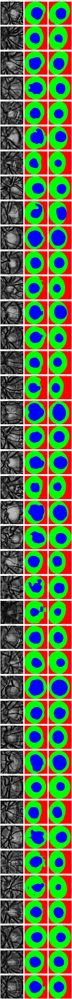

In [77]:
# Define the number of images to visualize
num_images =40

# Create a figure and axes for subplots
plt.figure(figsize=(15, 5*num_images))

# Loop through each image
for i in range(num_images):
    # Plot the original image on the left
    plt.subplot(num_images, 3, i*3 + 1)
    plt.imshow(test_images[i])
    plt.title('Image: ' + test['file_name'].iloc[i])
    plt.axis('off')

    # Plot the predicted mask in the middle
    plt.subplot(num_images, 3, i*3 + 2)
    plt.imshow(pred[i], cmap='gray')  # Assuming predicted masks are grayscale
    plt.title('Predicted Mask: ' + test['file_name'].iloc[i])
    plt.axis('off')

    # Plot the ground truth mask on the right
    plt.subplot(num_images, 3, i*3 + 3)
    plt.imshow(test_masks[i], cmap='gray')  # Assuming ground truth masks are grayscale
    plt.title('Ground Truth Mask: ' + test['mask_name'].iloc[i])
    plt.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()